# Dry Bean Classification
Details can be found here - http://archive.ics.uci.edu/dataset/602/dry+bean+dataset

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

import os

from autogluon.tabular import TabularDataset, TabularPredictor
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.model_selection import StratifiedShuffleSplit

model_save_path = os.path.join(os.environ['HOME'], 'autogluon_models', 'dry_beans_classification')

### Get Dataset

In [2]:
dry_bean_data = pd.read_excel('../../data/Dry_Bean_Dataset.xlsx')
print(dry_bean_data.shape)
dry_bean_data.head()

(13611, 17)


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [3]:
dry_bean_data.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


In [4]:
dry_bean_data.isna().values.sum() # no na

0

In [5]:
dry_bean_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

### Data analysis

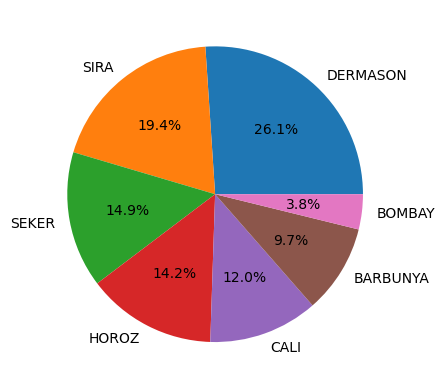

In [6]:
sizes = dry_bean_data['Class'].value_counts()

fig, ax = plt.subplots()
ax.pie(sizes, labels=sizes.index, autopct='%1.1f%%')
plt.show()

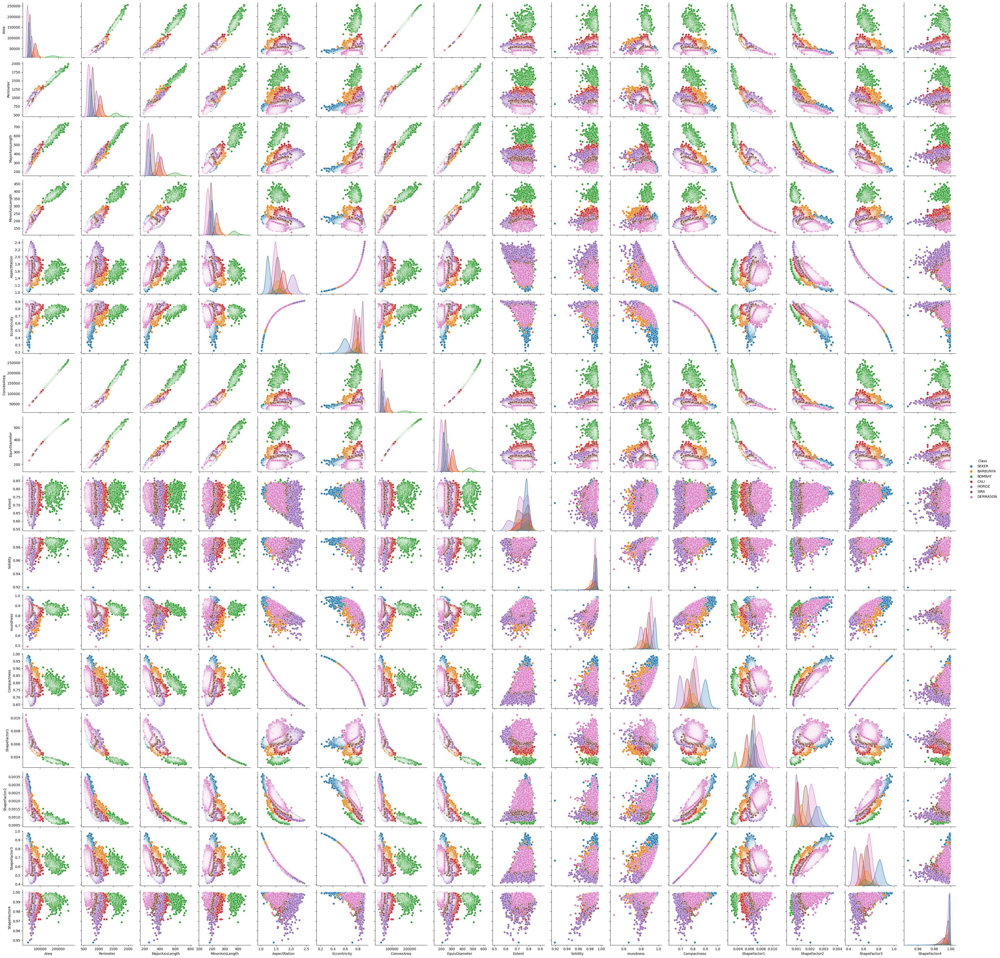

In [7]:
label = 'Class'
sns.pairplot(dry_bean_data, hue=label) 

/var/folders/xl/w9y4tjx938vdwtkgzwxsxx8m0000gp/T/ipykernel_33492/2989689023.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(dry_bean_data.corr(), annot=True, ax=ax);


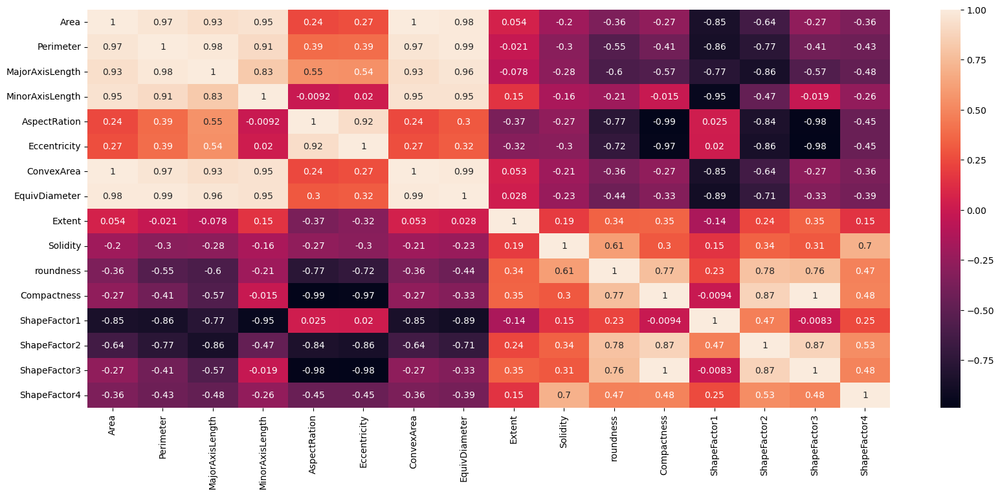

In [8]:
fig, ax = plt.subplots(figsize=(20, 8))
sns.heatmap(dry_bean_data.corr(), annot=True, ax=ax);
plt.show()

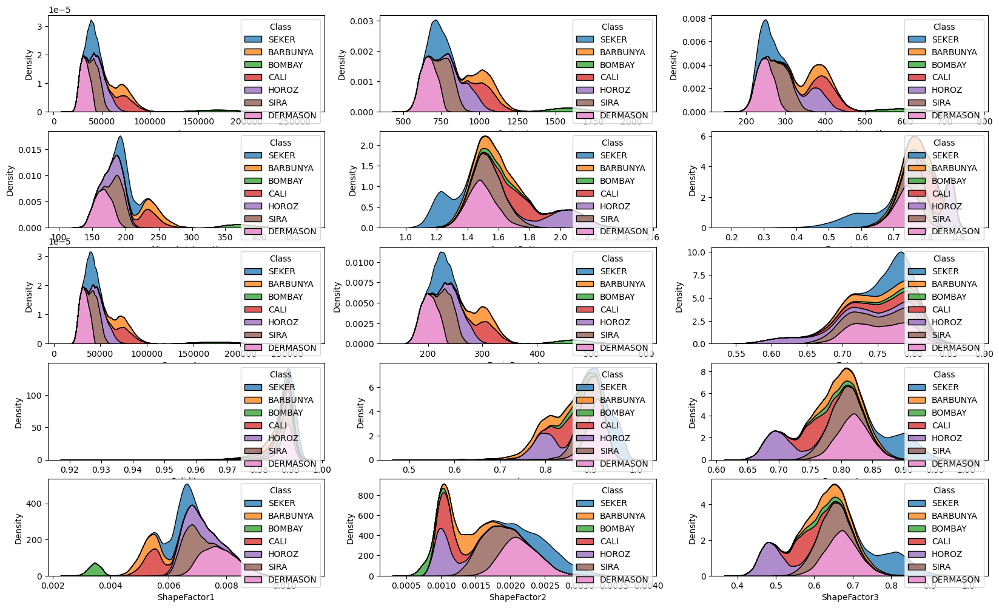

In [9]:
all_variables = dry_bean_data.columns
label = 'Class'
all_variables = all_variables.drop(label)

fig, axs = plt.subplots(nrows=5, ncols=3, figsize=(20, 12))

for row in range(0, 5):
    for col in range(0, 3):
        sns.kdeplot(data=dry_bean_data, x=all_variables[row*3+col], hue=label, multiple="stack", ax=axs[row][col])

### split dataset

In [10]:
#split data
strat_split = StratifiedShuffleSplit(n_splits=1, test_size=0.15, random_state=21)
test_df = None
train_df = None
for train_idx, test_idx in strat_split.split(dry_bean_data, dry_bean_data[label]):
    test_df = dry_bean_data.loc[test_idx]
    train_df = dry_bean_data.loc[train_idx]
    
print(train_df.shape)    
print(test_df.shape)

(11569, 17)
(2042, 17)


### Train AutoML with AutoGluon

In [11]:
training_dataset = TabularDataset.from_records(train_df)
predictor = TabularPredictor(label=label, path=model_save_path, eval_metric='accuracy').fit(training_dataset)

Beginning AutoGluon training ...
AutoGluon will save models to "/Users/Michael_Enudi/autogluon_models/dry_beans_classification/"
AutoGluon Version:  0.7.0
Python Version:     3.9.16
Operating System:   Darwin
Platform Machine:   x86_64
Platform Version:   Darwin Kernel Version 22.5.0: Thu Jun  8 22:22:22 PDT 2023; root:xnu-8796.121.3~7/RELEASE_X86_64
Train Data Rows:    11569
Train Data Columns: 16
Label Column: Class
Preprocessing data ...
AutoGluon infers your prediction problem is: 'multiclass' (because dtype of label-column == object).
	7 unique label values:  ['BARBUNYA', 'SIRA', 'DERMASON', 'SEKER', 'HOROZ', 'BOMBAY', 'CALI']
	If 'multiclass' is not the correct problem_type, please manually specify the problem_type parameter during predictor init (You may specify problem_type as one of: ['binary', 'multiclass', 'regression'])
Train Data Class Count: 7
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                  

In [12]:
predictor.leaderboard();

                  model  score_val  pred_time_val   fit_time  pred_time_val_marginal  fit_time_marginal  stack_level  can_infer  fit_order
0   WeightedEnsemble_L2   0.943820       0.027992  14.430383                0.000566           0.619000            2       True         14
1        NeuralNetTorch   0.942092       0.012754   8.151181                0.012754           8.151181            1       True         12
2       NeuralNetFastAI   0.941227       0.013312   8.423717                0.013312           8.423717            1       True          3
3         LightGBMLarge   0.940363       0.017572   4.670564                0.017572           4.670564            1       True         13
4              LightGBM   0.938634       0.005059   1.629201                0.005059           1.629201            1       True          5
5            LightGBMXT   0.938634       0.009364   3.712364                0.009364           3.712364            1       True          4
6              CatBoost   0

Computing feature importance via permutation shuffling for 16 features using 5000 rows with 5 shuffle sets...
	13.29s	= Expected runtime (2.66s per shuffle set)
	6.3s	= Actual runtime (Completed 5 of 5 shuffle sets)


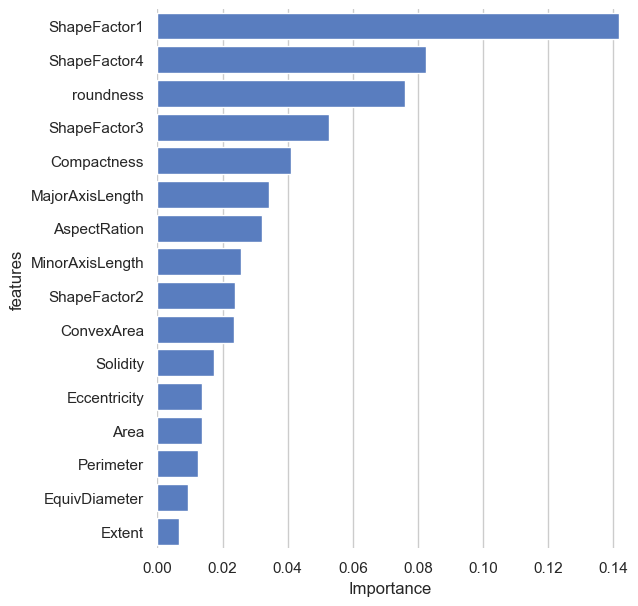

In [13]:
feature_imp = predictor.feature_importance(training_dataset)
sns.set_theme(style="whitegrid")

# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(6, 7))

# Plot the total crashes
sns.set_color_codes("muted")
sns.barplot(y=feature_imp.index, x=feature_imp.importance, label="Importance", color="b", ax=ax)

ax.set(xlim=(0, feature_imp.importance.max()+0.001), ylabel="features", xlabel="Importance")
sns.despine(left=True, bottom=True)

In [14]:
predictor.fit_summary();

*** Summary of fit() ***
Estimated performance of each model:
                  model  score_val  pred_time_val   fit_time  pred_time_val_marginal  fit_time_marginal  stack_level  can_infer  fit_order
0   WeightedEnsemble_L2   0.943820       0.027992  14.430383                0.000566           0.619000            2       True         14
1        NeuralNetTorch   0.942092       0.012754   8.151181                0.012754           8.151181            1       True         12
2       NeuralNetFastAI   0.941227       0.013312   8.423717                0.013312           8.423717            1       True          3
3         LightGBMLarge   0.940363       0.017572   4.670564                0.017572           4.670564            1       True         13
4              LightGBM   0.938634       0.005059   1.629201                0.005059           1.629201            1       True          5
5            LightGBMXT   0.938634       0.009364   3.712364                0.009364           3.712364 

/Users/Michael_Enudi/opt/anaconda3/envs/autogluon/lib/python3.9/site-packages/autogluon/core/utils/plots.py:138: UserWarning: AutoGluon summary plots cannot be created because bokeh is not installed. To see plots, please do: "pip install bokeh==2.0.1"
  warnings.warn('AutoGluon summary plots cannot be created because bokeh is not installed. To see plots, please do: "pip install bokeh==2.0.1"')


In [15]:
predictor.evaluate(training_dataset);

Evaluation: accuracy on test data: 0.9383697813121272
Evaluations on test data:
{
    "accuracy": 0.9383697813121272,
    "balanced_accuracy": 0.9473990983720684,
    "mcc": 0.9254510007938965
}


## Testing and evaluation

Accuracy score: 0.9358
Precision score: 0.9468
Recall score: 0.9428
F1 score: 0.9447
Confusion Matrix


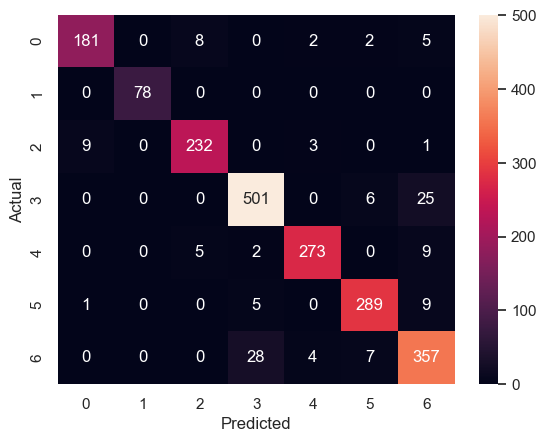

In [16]:
test_dataset = TabularDataset.from_records(test_df.drop(columns=[label], axis=1))
y_true = test_df[label]
y_pred = predictor.predict(test_dataset)
print("Accuracy score:", round(accuracy_score(y_true, y_pred),4))
print("Precision score:", round(precision_score(y_true, y_pred, average='macro'),4))
print("Recall score:", round(recall_score(y_true, y_pred, average='macro'),4))
print("F1 score:", round(f1_score(y_true, y_pred, average='macro'),4))
print("Confusion Matrix")
ax =  sns.heatmap(confusion_matrix(y_true, y_pred), annot=True, fmt='')
ax.set_ylabel('Actual')
ax.set_xlabel('Predicted');

### Save model 

In [17]:
predictor.save()

TabularPredictor saved. To load, use: predictor = TabularPredictor.load("/Users/Michael_Enudi/autogluon_models/dry_beans_classification/")


### Load back from save location

In [18]:
predictor2 = TabularPredictor.load(model_save_path)

In [19]:
predictor2.evaluate(TabularDataset.from_records(test_df))

Evaluation: accuracy on test data: 0.935847208619001
Evaluations on test data:
{
    "accuracy": 0.935847208619001,
    "balanced_accuracy": 0.9428027482017963,
    "mcc": 0.9224020162136758
}


{'accuracy': 0.935847208619001,
 'balanced_accuracy': 0.9428027482017963,
 'mcc': 0.9224020162136758}